# **Importing Libraries**

In [1]:
import os

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # for data visualization
import matplotlib.pyplot as plt # for data visualization

# Data Cleaning and Preparation
from category_encoders import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler

# Model Performance and Spliting
from sklearn.model_selection import train_test_split,cross_val_score, GridSearchCV,RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

#Modeling Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

# ExplainableAI
import shap
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.inspection import permutation_importance

import warnings
warnings.filterwarnings('ignore')

2024-04-15 12:40:52.705113: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-15 12:40:52.705341: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-15 12:40:52.904674: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# **Data Info**

In [2]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/water-potability/water_potability.csv


In [3]:
df = pd.read_csv(os.path.join(dirname, filename))
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [4]:
df.shape

(3276, 10)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ph,2785.0,7.080795,1.594320,0.000000,6.093092,7.036752,8.062066,14.000000
Hardness,3276.0,196.369496,32.879761,47.432000,176.850538,196.967627,216.667456,323.124000
Solids,3276.0,22014.092526,8768.570828,320.942611,15666.690297,20927.833607,27332.762127,61227.196008
Chloramines,3276.0,7.122277,1.583085,0.352000,6.127421,7.130299,8.114887,13.127000
Sulfate,2495.0,333.775777,41.416840,129.000000,307.699498,333.073546,359.950170,481.030642
Conductivity,3276.0,426.205111,80.824064,181.483754,365.734414,421.884968,481.792304,753.342620
Organic_carbon,3276.0,14.284970,3.308162,2.200000,12.065801,14.218338,16.557652,28.300000
Trihalomethanes,3114.0,66.396293,16.175008,0.738000,55.844536,66.622485,77.337473,124.000000
Turbidity,3276.0,3.966786,0.780382,1.450000,3.439711,3.955028,4.500320,6.739000
Potability,3276.0,0.390110,0.487849,0.000000,0.000000,0.000000,1.000000,1.000000


# **Exploratory Data Analysis**

In [7]:
df.duplicated().any()

False

In [8]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [9]:
percentage_missing = round(df.isnull().sum() * 100 / len(df),4)
missing_value_df = pd.DataFrame({'Missing_Percentage' : percentage_missing})
missing_value_df.sort_values(by='Missing_Percentage', ascending = False).head()

,Missing_Percentage
Sulfate,23.8400
ph,14.9878
Trihalomethanes,4.9451
Hardness,0.0000
Solids,0.0000


In [10]:
df['Sulfate'] = df['Sulfate'].fillna(df['Sulfate'].mean())
df['ph'] = df['ph'].fillna(df['ph'].mean())
df['Trihalomethanes'] = df['Trihalomethanes'].fillna(df['Trihalomethanes'].mean())
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

## **Data Visualization**

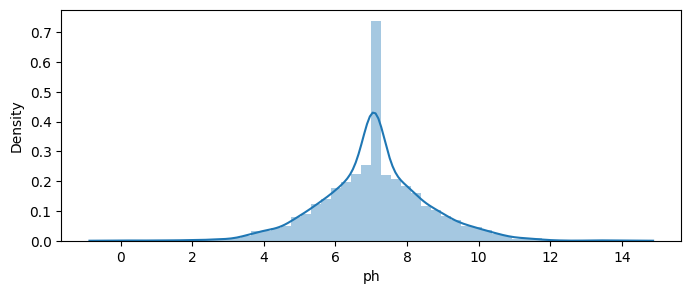

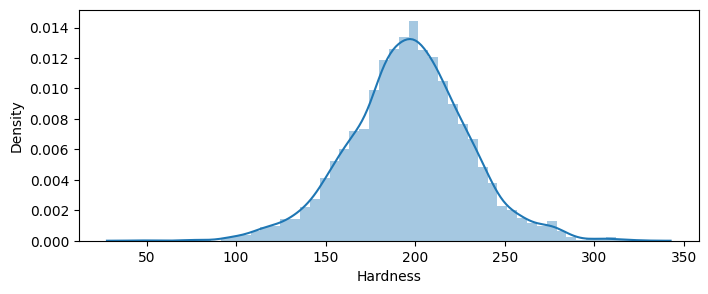

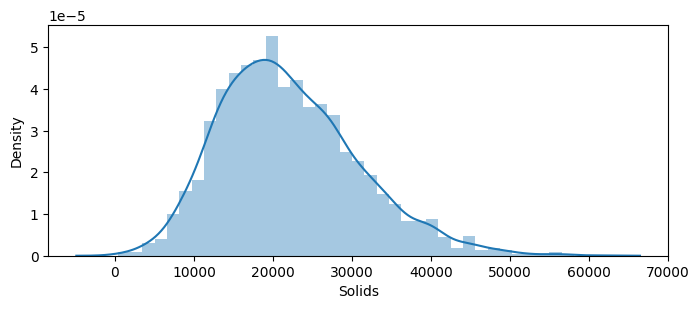

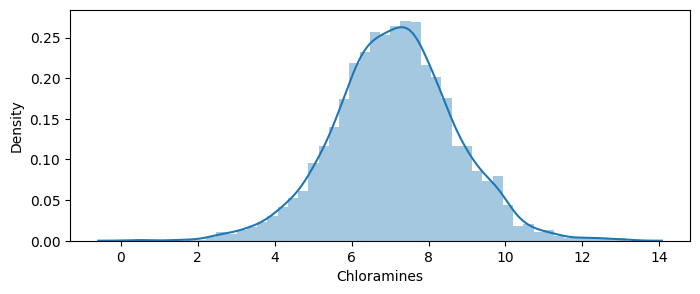

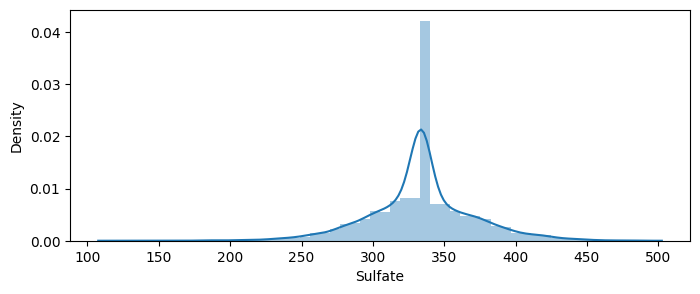

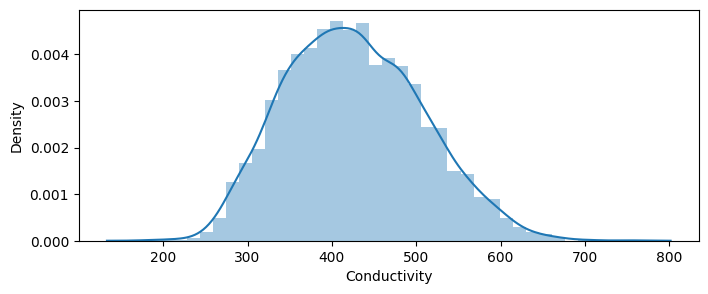

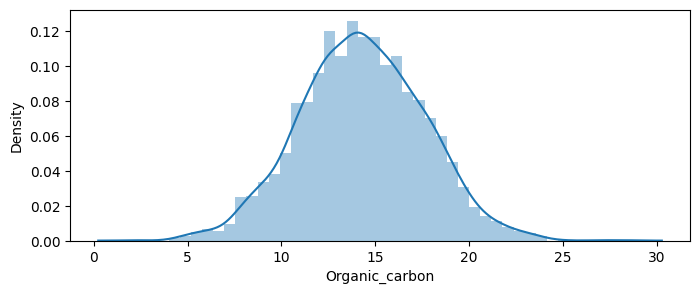

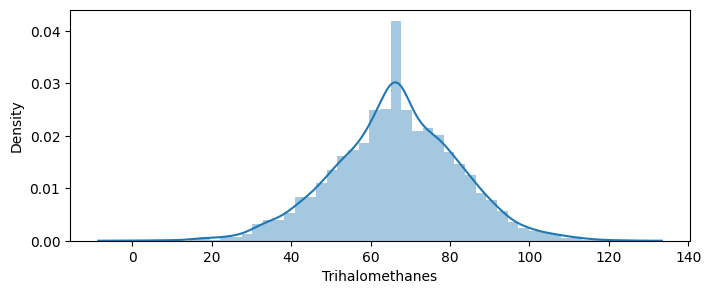

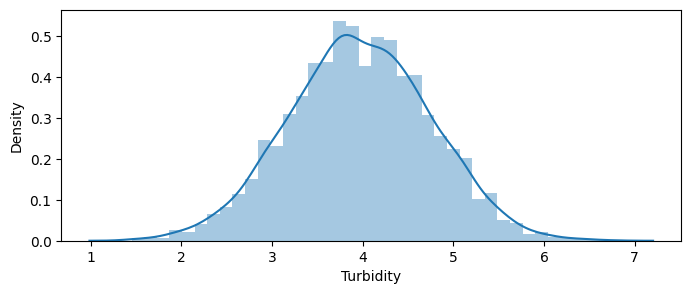

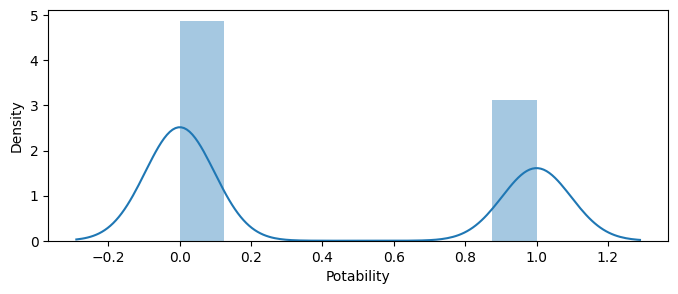

In [11]:
for i in df.columns:
    plt.figure(figsize=(8,3))
    sns.distplot(df[i])
    plt.show()

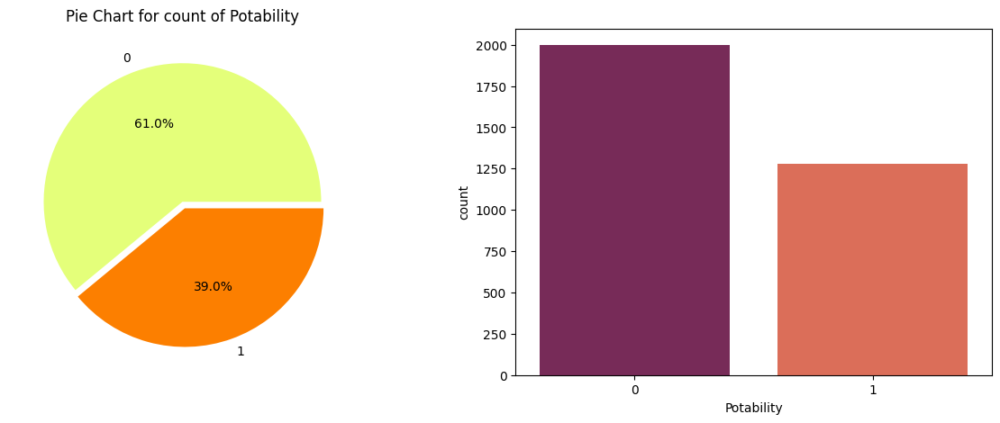

In [12]:
figure, axis = plt.subplots(nrows=1, ncols = 2, figsize=(15,5))
df['Potability'].value_counts().plot.pie(ax=axis[0], autopct='%1.1f%%',title="Pie Chart for count of Potability", 
                                  legend=False, colormap='Wistia', startangle=0, explode=(0, 0.05), ylabel='')        # explode=(0.01, 0.05, 0.05, 0.05),
sns.countplot(data=df, x='Potability', palette="rocket")
plt.show();

### **Correlation Matrix**

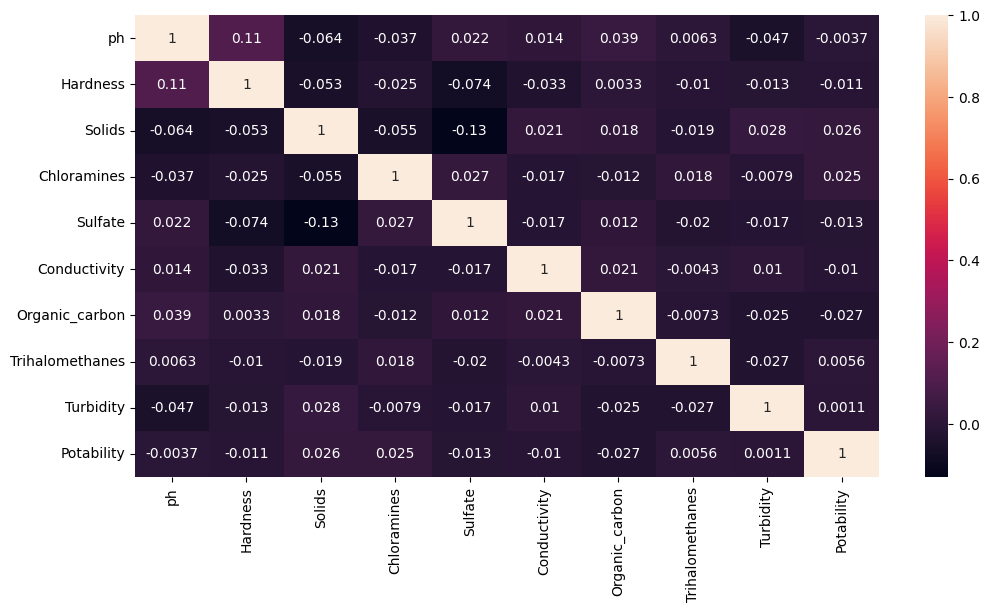

In [13]:
correlation_matrix = df.corr(method='spearman')
df.corr()
plt.subplots(figsize=(12,6))
sns.heatmap(data = correlation_matrix, annot=True)
plt.show()

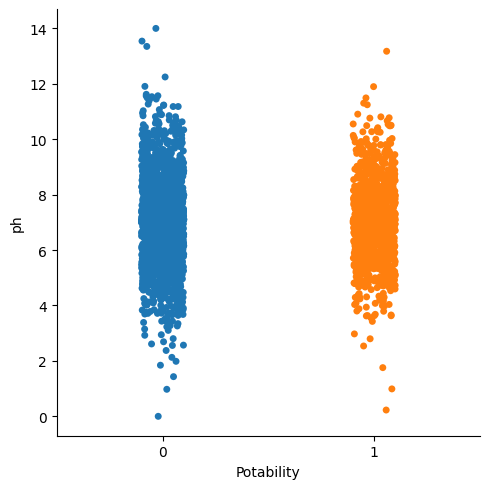

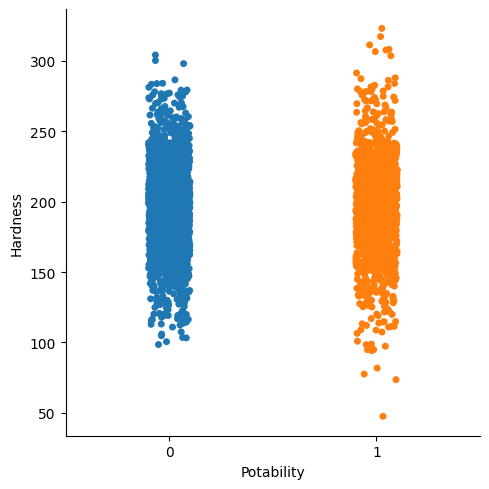

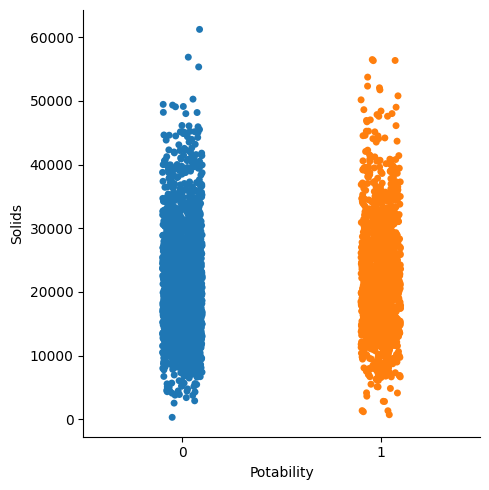

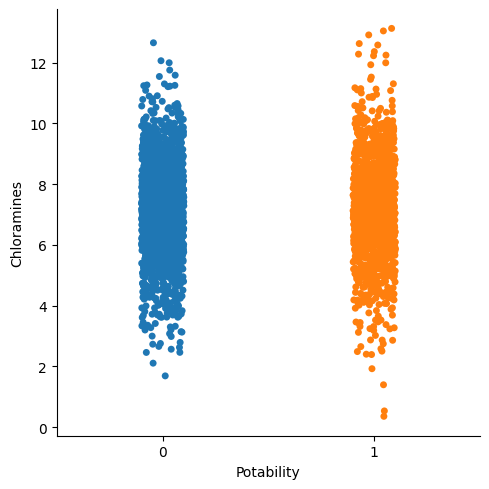

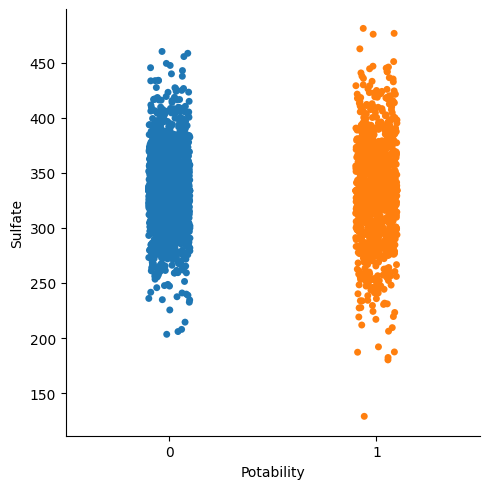

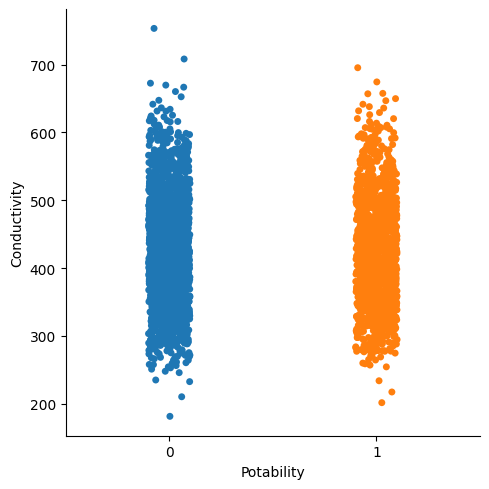

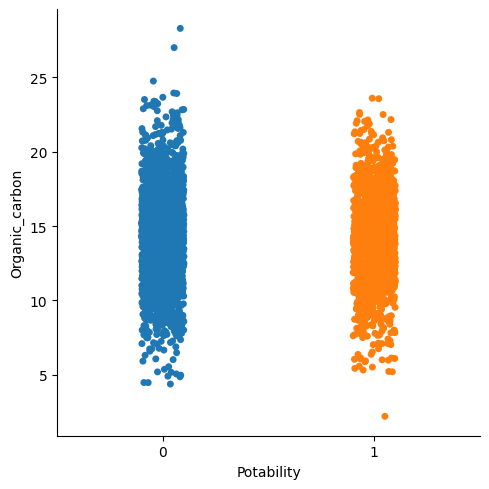

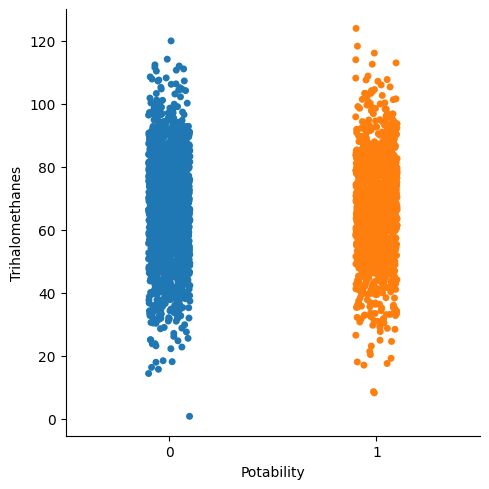

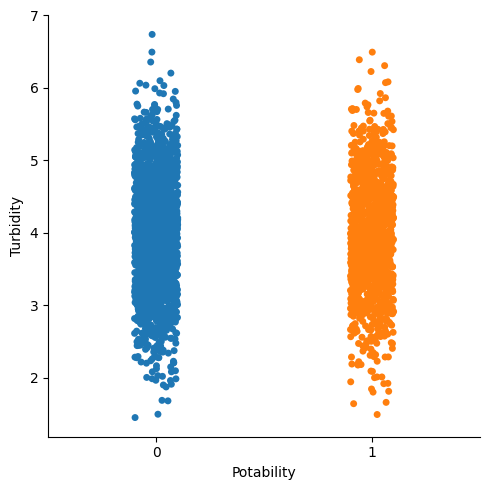

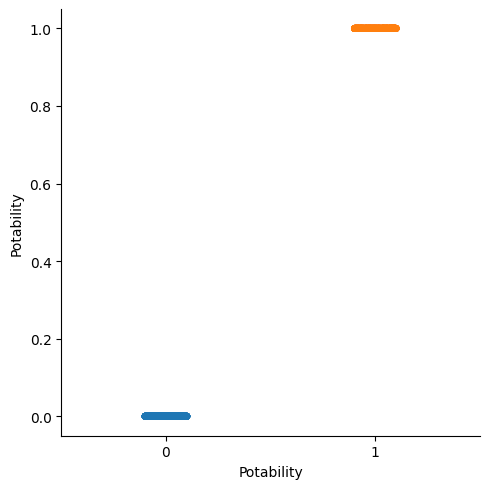

In [14]:
for i in df.columns:
    sns.catplot(data=df, y=i, x='Potability', palette='tab10')

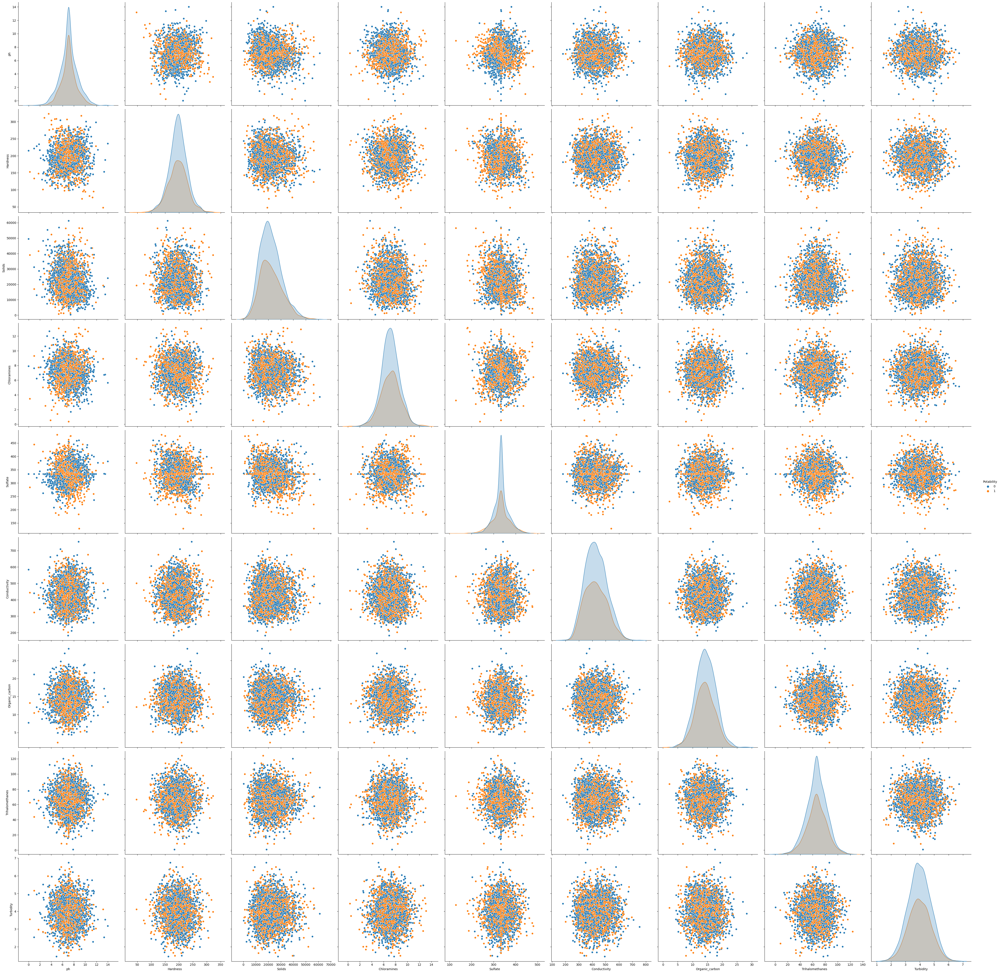

In [15]:
sns.pairplot(data = df, hue='Potability', height=5, palette='tab10')
plt.show();

# **Machine Learning Section**

### **Scaling Numerical Data**

In [16]:
numerical_variables = set(df.columns) - set(['Potability'])
numerical_variables

{'Chloramines',
 'Conductivity',
 'Hardness',
 'Organic_carbon',
 'Solids',
 'Sulfate',
 'Trihalomethanes',
 'Turbidity',
 'ph'}

In [17]:
transformer = MinMaxScaler()
MinMax_scaled_df = df.copy()

def scaling(numerical_variables):
    return transformer.fit_transform(MinMax_scaled_df[numerical_variables].values.reshape(-1,1))

for i in numerical_variables:
    MinMax_scaled_df[i] = scaling(i)

MinMax_scaled_df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.505771,0.571139,0.336096,0.543891,0.680385,0.669439,0.313402,0.699753,0.286091,0
1,0.265434,0.297400,0.300611,0.491839,0.581699,0.719411,0.497319,0.450999,0.576793,0
2,0.578509,0.641311,0.321619,0.698543,0.581699,0.414652,0.562017,0.532866,0.303637,0
3,0.594055,0.605536,0.356244,0.603314,0.647347,0.317880,0.622089,0.808065,0.601015,0
4,0.649445,0.484851,0.289922,0.484900,0.514545,0.379337,0.358555,0.253606,0.496327,0


In [18]:
transformer = StandardScaler()
Standard_scaled_df = df.copy()

def scaling(numerical_variables):
    return transformer.fit_transform(Standard_scaled_df[numerical_variables].values.reshape(-1,1))

for i in numerical_variables:
    Standard_scaled_df[i] = scaling(i)

Standard_scaled_df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,-6.043133e-16,0.259195,-0.139471,0.112415,9.613574e-01,1.708954,-1.180651,1.306149,-1.286298,0
1,-2.289339e+00,-2.036414,-0.385987,-0.307694,3.145987e-15,2.062575,0.270597,-0.638480,0.684218,0
2,6.928678e-01,0.847665,-0.240047,1.360594,3.145987e-15,-0.094032,0.781117,0.001509,-1.167365,0
3,8.409504e-01,0.547651,0.000493,0.592008,6.395190e-01,-0.778830,1.255134,2.152874,0.848412,0
4,1.368569e+00,-0.464429,-0.460249,-0.363698,-6.541765e-01,-0.343939,-0.824357,-2.181599,0.138786,0


In [19]:
transformer = RobustScaler()
Robust_scaled_df = df.copy()

def scaling(numerical_variables):
    return transformer.fit_transform(Robust_scaled_df[numerical_variables].values.reshape(-1,1))

for i in numerical_variables:
    Robust_scaled_df[i] = scaling(i)

Robust_scaled_df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.000000,0.198981,-0.011702,0.085492,1.043542,1.227178,-0.854560,1.028759,-0.935210,0
1,-2.113014,-1.696382,-0.196962,-0.249088,0.000000,1.473406,0.214093,-0.502884,0.514449,0
2,0.639503,0.684850,-0.087287,1.079558,0.000000,-0.028251,0.590024,0.001189,-0.847715,0
3,0.776180,0.437145,0.093483,0.467446,0.694190,-0.505079,0.939076,1.695662,0.635242,0
4,1.263161,-0.398477,-0.252771,-0.293690,-0.710100,-0.202262,-0.592197,-1.718287,0.113188,0


### **Train-Test Split**

In [20]:
y = Robust_scaled_df['Potability']
X = Robust_scaled_df.drop(['Potability'], axis=1)

In [21]:
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.3)

In [22]:
X_train.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
3118,0.849452,0.700417,-0.693839,-0.478400,-0.187512,-0.086466,0.708414,0.325742,-0.122848
2262,0.000000,0.942921,-0.161917,-0.168246,-0.326799,0.134362,0.866019,-0.013141,-0.415734
1111,-0.707666,0.752631,-0.771229,1.281516,0.000000,-0.611043,-0.135511,0.208558,0.012841
2882,0.312250,0.194964,-0.084284,-0.471780,0.000000,0.823710,-0.053989,-0.587373,-0.425425
2865,1.287367,1.752454,-0.942789,-0.562694,0.552022,1.041909,-0.722226,-0.030663,0.769762


In [23]:
y_train.value_counts()

Potability
0    1397
1     896
Name: count, dtype: int64

### **1. Logistic Regression**

In [24]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)

 ************************ LOGISTIC REGRESSION MODEL RESULTS ************************ 
Accuracy score of testing set 0.61 

Precision score of testing set 0.49 

Recall score of testing set 0.61 

F1 score of testing set 0.47 



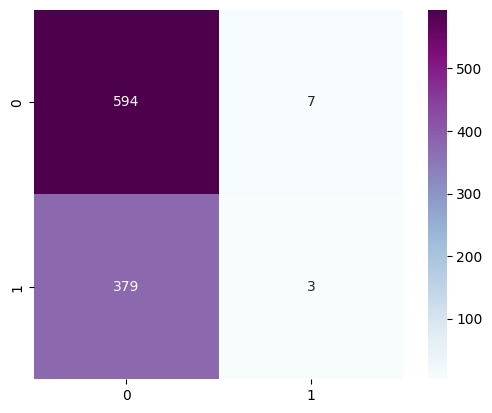

In [25]:
print("\033[1m ************************ LOGISTIC REGRESSION MODEL RESULTS ************************ \033[0m")
print('Accuracy score of testing set', round(accuracy_score(y_test, y_pred_log_reg),2), '\n')
print('Precision score of testing set', round(precision_score(y_test, y_pred_log_reg,average="weighted"),2), '\n')
print('Recall score of testing set', round(recall_score(y_test, y_pred_log_reg,average="weighted"),2), '\n')
print('F1 score of testing set', round(f1_score(y_test, y_pred_log_reg,average="weighted"),2), '\n')
cm_log_reg = confusion_matrix(y_test,y_pred_log_reg)
sns.heatmap(cm_log_reg, annot=True, square=True, fmt='1', cmap = 'BuPu')
plt.show()

### **2. Random Forest Classifier**

In [26]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred_rfc = rfc.predict(X_test)

 ************************ Random Forest Classifier MODEL RESULTS ************************ 
Accuracy score of testing set 0.67 

Precision score of testing set 0.67 

Recall score of testing set 0.67 

F1 score of testing set 0.64 



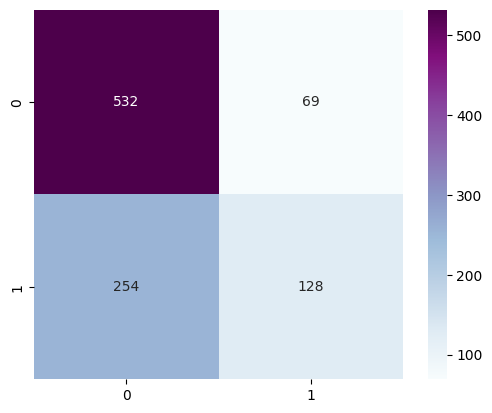

In [27]:
print("\033[1m ************************ Random Forest Classifier MODEL RESULTS ************************ \033[0m")
print('Accuracy score of testing set', round(accuracy_score(y_test, y_pred_rfc),2), '\n')
print('Precision score of testing set', round(precision_score(y_test, y_pred_rfc,average="weighted"),2), '\n')
print('Recall score of testing set', round(recall_score(y_test, y_pred_rfc,average="weighted"),2), '\n')
print('F1 score of testing set', round(f1_score(y_test, y_pred_rfc,average="weighted"),2), '\n')
cm_rfc = confusion_matrix(y_test,y_pred_rfc)
sns.heatmap(cm_rfc, annot=True, square=True, fmt='1', cmap = 'BuPu')
plt.show()

### **3. Decision Tree Classifier**

In [28]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)
y_pred_dt = dtc.predict(X_test)

 ************************ Decision Tree Classifier MODEL RESULTS ************************ 
Accuracy score of testing set 0.57 

Precision score of testing set 0.57 

Recall score of testing set 0.57 

F1 score of testing set 0.57 



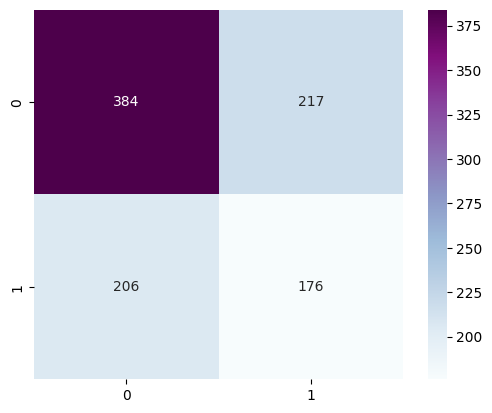

In [29]:
print("\033[1m ************************ Decision Tree Classifier MODEL RESULTS ************************ \033[0m")
print('Accuracy score of testing set', round(accuracy_score(y_test, y_pred_dt),2), '\n')
print('Precision score of testing set', round(precision_score(y_test, y_pred_dt,average="weighted"),2), '\n')
print('Recall score of testing set', round(recall_score(y_test, y_pred_dt,average="weighted"),2), '\n')
print('F1 score of testing set', round(f1_score(y_test, y_pred_dt,average="weighted"),2), '\n')
cm_dtc = confusion_matrix(y_test,y_pred_dt)
sns.heatmap(cm_dtc, annot=True, square=True, fmt='1', cmap = 'BuPu')
plt.show()

### **4. KNN Classifier**

In [30]:
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)
y_pred_knn = knn.predict(X_test)

 ************************ K Neighbors Classifier MODEL RESULTS ************************ 
Accuracy score of testing set 0.63 

Precision score of testing set 0.61 

Recall score of testing set 0.63 

F1 score of testing set 0.57 



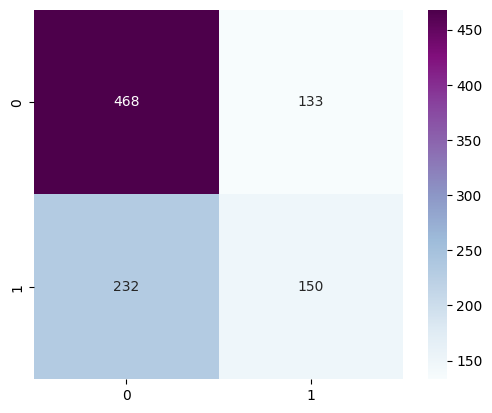

In [31]:
print("\033[1m ************************ K Neighbors Classifier MODEL RESULTS ************************ \033[0m")
print('Accuracy score of testing set', round(accuracy_score(y_test, y_pred_knn),2), '\n')
print('Precision score of testing set', round(precision_score(y_test, y_pred_knn,average="weighted"),2), '\n')
print('Recall score of testing set', round(recall_score(y_test, y_pred_knn,average="weighted"),2), '\n')
print('F1 score of testing set', round(f1_score(y_test, y_pred_dt,average="weighted"),2), '\n')
cm_knn = confusion_matrix(y_test,y_pred_knn)
sns.heatmap(cm_knn, annot=True, square=True, fmt='1', cmap = 'BuPu')
plt.show()

## **Model Comparison**

### Accuracy // 3-Fold Cross-Validated

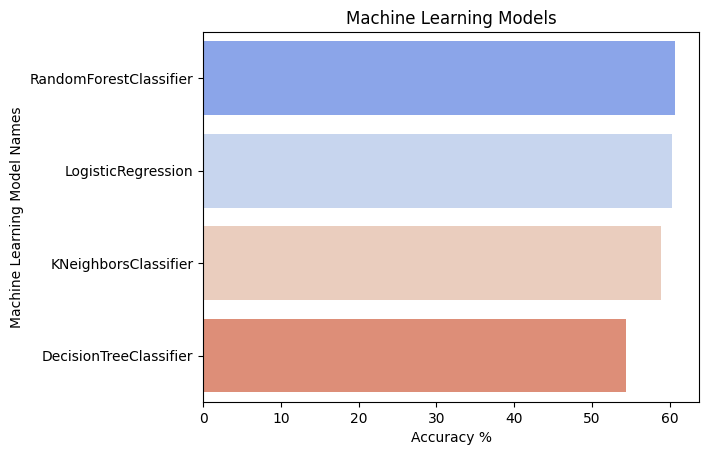

In [32]:
models = [log_reg, rfc, dtc, knn]

result_accuracy = []
results_accuracy = pd.DataFrame(columns=["Models", "Accuracy"])

for model in models:
    names = model.__class__.__name__
    y_pred = model.predict(X_test)
    accuracy = cross_val_score(model, X_test, y_test, cv=3, scoring="accuracy", n_jobs=-1).mean()
    result_accuracy = pd.DataFrame([[names, accuracy*100]], columns=["Models", "Accuracy"])
    results_accuracy = results_accuracy._append(result_accuracy)
    
sns.barplot(x='Accuracy', y='Models', data=results_accuracy.sort_values(by='Accuracy',ascending=False), palette="coolwarm")
plt.xlabel('Accuracy %')
plt.ylabel("Machine Learning Model Names")
plt.title("Machine Learning Models", loc="center")
plt.show();

In [33]:
results_accuracy.sort_values(by='Accuracy',ascending=False)

,Models,Accuracy
0,RandomForestClassifier,60.730713
0,LogisticRegression,60.326384
0,KNeighborsClassifier,58.902377
0,DecisionTreeClassifier,54.323923


### F1Score // 3-Fold Cross-Validated

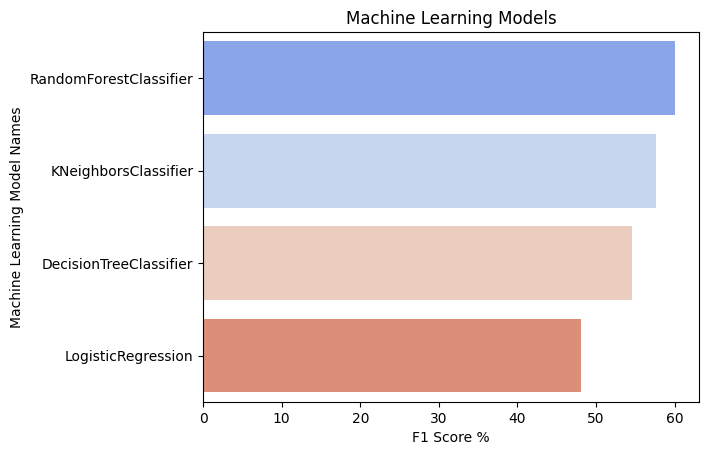

In [34]:
models = [log_reg, rfc, dtc, knn]

result_accuracy = []
results_accuracy = pd.DataFrame(columns=["Models", "F1 Score"])

for model in models:
    names = model.__class__.__name__
    y_pred = model.predict(X_test)
    f1_score = cross_val_score(model, X_test, y_test, cv=3, scoring="f1_weighted", n_jobs=-1).mean()
    result_accuracy = pd.DataFrame([[names, f1_score*100]], columns=["Models", "F1 Score"])
    results_accuracy = results_accuracy._append(result_accuracy)

sns.barplot(x='F1 Score', y='Models', data=results_accuracy.sort_values(by='F1 Score',ascending=False), palette="coolwarm")
plt.xlabel('F1 Score %')
plt.ylabel("Machine Learning Model Names")
plt.title("Machine Learning Models", loc="center")
plt.show();

In [35]:
results_accuracy.sort_values(by='F1 Score',ascending=False)

,Models,F1 Score
0,RandomForestClassifier,60.090525
0,KNeighborsClassifier,57.599960
0,DecisionTreeClassifier,54.557754
0,LogisticRegression,48.023454


## **Hyperparameter Optimization** for RandomForestClassifier

In [36]:
rfc_parameters = {
    'n_estimators': [100, 200, 300], 
    'max_features': ['sqrt', 'log2', None], 
    'max_depth': [3, 6, 9], 
    'max_leaf_nodes': [3, 6, 9]
}

In [37]:
rfc_cv = RandomForestClassifier()
rfc_grid = GridSearchCV(rfc_cv, rfc_parameters, cv=3).fit(X_train, y_train)
print("Best parameters of Random Forest Classifier:", str(rfc_grid.best_params_))

Best parameters of Random Forest Classifier: {'max_depth': 6, 'max_features': None, 'max_leaf_nodes': 9, 'n_estimators': 300}


In [38]:
rfc_grid.best_estimator_

RandomForestClassifier(max_depth=6, max_features=None, max_leaf_nodes=9,
                       n_estimators=300)

## **Tuned RandomForestClassifier**

In [39]:
rfc_tuned = RandomForestClassifier(max_depth=6, max_features='sqrt', max_leaf_nodes=9, n_estimators=100)
rfc_tuned.fit(X_train,y_train)
y_pred_rfc_tuned = rfc_tuned.predict(X_test)

 ************************ Random Forest Classifier Tuned Training MODEL RESULTS ************************ 
Accuracy score of testing set 0.64 

Precision score of testing set 0.68 

Recall score of testing set 0.64 

F1 score of testing set 0.54 

 ************************ Random Forest Classifier Tuned Testing MODEL RESULTS ************************ 
Accuracy score of testing set 0.61 

Precision score of testing set 0.59 

Recall score of testing set 0.61 

F1 score of testing set 0.52 



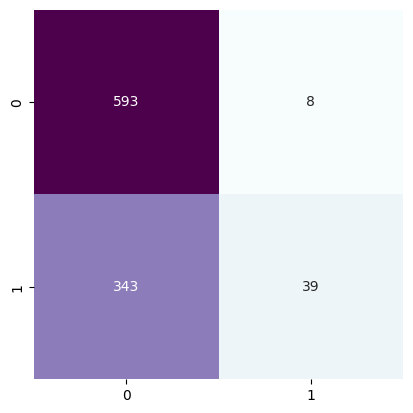

In [40]:
print("\033[1m ************************ Random Forest Classifier Tuned Training MODEL RESULTS ************************ \033[0m")
print('Accuracy score of testing set', round(cross_val_score(rfc_tuned, X_train, y_train, cv=3, scoring= 'accuracy').mean(),2), '\n')
print('Precision score of testing set', round(cross_val_score(rfc_tuned, X_train, y_train, cv=3, scoring= 'precision_weighted').mean(),2), '\n')
print('Recall score of testing set', round(cross_val_score(rfc_tuned, X_train, y_train, cv=3, scoring= 'recall_weighted').mean(),2), '\n')
print('F1 score of testing set', round(cross_val_score(rfc_tuned, X_train, y_train, cv=3, scoring= 'f1_weighted').mean(),2), '\n')

print("\033[1m ************************ Random Forest Classifier Tuned Testing MODEL RESULTS ************************ \033[0m")
print('Accuracy score of testing set', round(cross_val_score(rfc_tuned, X_test, y_test, cv=3, scoring= 'accuracy').mean(),2), '\n')
print('Precision score of testing set', round(cross_val_score(rfc_tuned, X_test, y_test, cv=3, scoring= 'precision_weighted').mean(),2), '\n')
print('Recall score of testing set', round(cross_val_score(rfc_tuned, X_test, y_test, cv=3, scoring= 'recall_weighted').mean(),2), '\n')
print('F1 score of testing set', round(cross_val_score(rfc_tuned, X_test, y_test, cv=3, scoring= 'f1_weighted').mean(),2), '\n')

cm_rfc = confusion_matrix(y_test,y_pred_rfc_tuned)
sns.heatmap(cm_rfc, annot=True, square=True, fmt='1', cmap = 'BuPu', cbar=False)
plt.show()

# **Feature Importance**

In [41]:
importance_df = pd.DataFrame({"Feature_Name":X.columns, "Importance":rfc_tuned.feature_importances_})
sorted_importance_df = importance_df.sort_values(by="Importance",ascending=False).head(10)
sorted_importance_df.head()

,Feature_Name,Importance
4,Sulfate,0.309965
0,ph,0.206220
1,Hardness,0.131822
3,Chloramines,0.125554
2,Solids,0.099780


In [42]:
sorted_importance_df.tail()

,Feature_Name,Importance
2,Solids,0.099780
7,Trihalomethanes,0.034246
8,Turbidity,0.033384
6,Organic_carbon,0.031238
5,Conductivity,0.027790


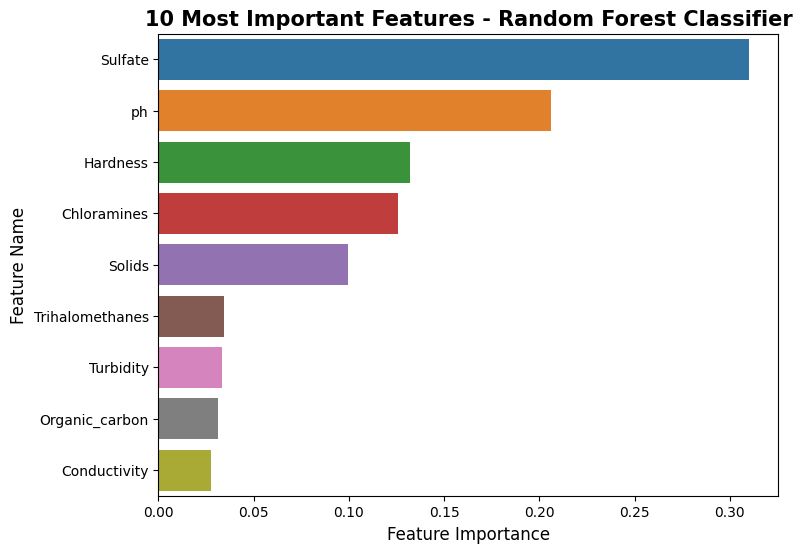

In [43]:
plt.figure(figsize=(8,6))
sns.barplot(data=sorted_importance_df, x='Importance', y='Feature_Name')
plt.title('10 Most Important Features - Random Forest Classifier',fontweight='bold',fontsize=15)
plt.xlabel('Feature Importance',fontsize=12)
plt.ylabel('Feature Name',fontsize=12)
plt.show()

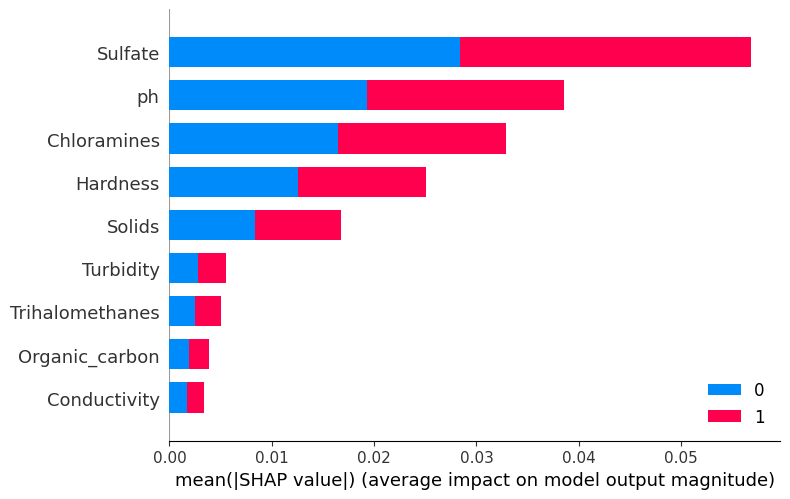

In [44]:
explainer = shap.TreeExplainer(rfc_tuned)
shap_values = explainer.shap_values(X_test[0:1000])
shap.summary_plot(shap_values,X_test[0:1000],plot_type='bar',max_display=10,class_names=rfc_tuned.classes_)

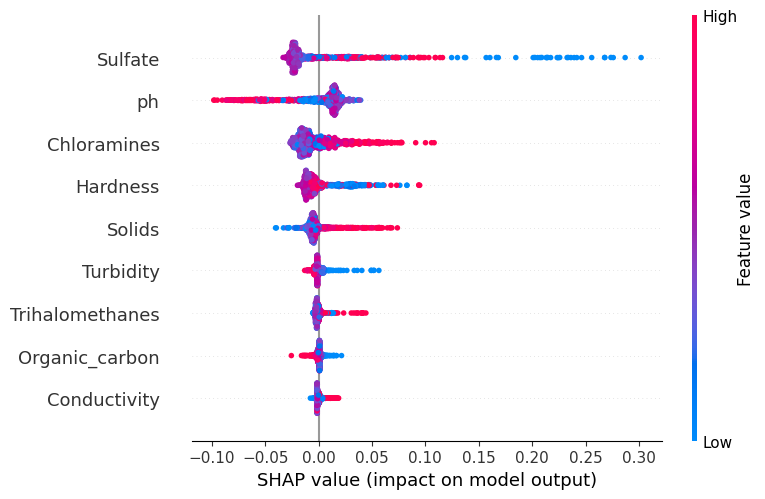

In [45]:
explainer = shap.TreeExplainer(rfc_tuned)
shap_values = explainer.shap_values(X_train[0:1000], approximate=False, check_additivity=False)
shap.summary_plot(shap_values[1], X_train[0:1000])